Potential Field Method

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from copy import deepcopy

import matplotlib.animation as animation
from IPython.display import HTML

from potential_field_method import *

kwargs_contourf = {
    'cmap': plt.cm.jet,
    'alpha': 0.8,
}

kwargs_surfaceplot = {
    'cmap': plt.cm.jet,
    'alpha': 0.8,
}

kwargs_imshow = {
    'cmap': plt.cm.jet, 
    'alpha': 0.8,
    'origin': 'lower',
    'aspect': 3,
}


# basic simulation

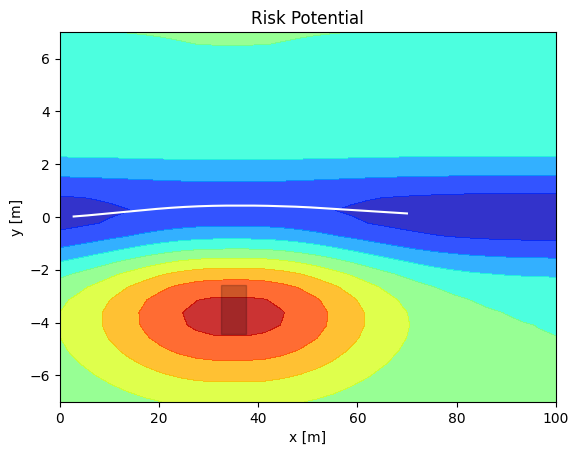

In [2]:
# simulation time
dt = 0.2 # time resolution
t_max = 5 # end time
time = np.arange(0,t_max,dt)

# create pfm object
pfm = PotentialFieldMethod()

#create road
lane_x = np.linspace(0, 100, 50)
lane_y = np.zeros_like(lane_x)
pfm.append_lane(lane_x, lane_y)

#create obstacle
obstacle = MovingObstacle()
pfm.append_obstacle(obstacle)

# set position of cars
pfm.ego.set_position(0,0, v= 14, yaw = 0.0)
obstacle.set_position(35, -3.5)

# empty lists to collect data
x_plot = []
y_plot = []
v_plot = []

for t in time:
    #update ego position
    pfm.update(dt)

    # append to plot lists
    x_plot.append(pfm.ego.x)
    y_plot.append(pfm.ego.y)
    v_plot.append(pfm.ego.v) 

# set plot ranges
X = np.linspace(-0, 100, 30)
Y = np.linspace(-7, 7, 30)
X,Y = np.meshgrid(X,Y)

# get hazard map
Z = pfm.get_risk_potential(X, Y)

# #plot risk potential
fig, ax = plt.subplots()
ax.contourf(X,Y,Z, **kwargs_contourf)
ax.add_patch(obstacle.plotoutline())

#plot ego trajectory position
ax.plot(x_plot, y_plot, color = 'white')


ax.set_ylabel("y [m]")
ax.set_xlabel("x [m]")
ax.set_title(f"Risk Potential")
# plt.legend()

plt.show()



# # plt.plot(a_plot, label = "accel")
# plt.plot(v_plot, label = "velo")

# plt.legend()
# plt.show()

# Generic Animations
## contourplot
### stationary obstacles
This is a baseline simulation of the potential field algorithm, that shows the path traveled, aswell as the prediction trajectory
For this the background is static

In [3]:
# simulation time
dt = 0.2 # time resolution
t_max = 5 # end time
time = np.arange(0,t_max,dt)

pfm = PotentialFieldMethod()
pfm.ego.set_position(0,0,0,v=14)

# traffic participant
obstacle = MovingObstacle()
obstacle.set_position(35,-1.75,0,0)
pfm.append_obstacle(obstacle)

# road setup
lane_x = np.linspace(0, 100, 50)
lane_y = np.zeros_like(lane_x)
pfm.append_lane(lane_x, lane_y)


# empty list to keep track of results
x_plot = []
y_plot = []


"""animation"""
fig, ax = plt.subplots()

# set plot ranges
X = np.linspace(-0, 70, 30)
Y = np.linspace(-7, 7, 30)
X,Y = np.meshgrid(X,Y)

# get hazard map
Z = pfm.get_risk_potential(X, Y)

# plot repulsive field as stationary background
ax.contourf(X,Y,Z, cmap=plt.cm.jet, alpha=0.8)

# add animated plot elements  
ego_path = ax.plot([], [], '--', color = 'white')[0]
prediction = ax.plot([],[], color = 'black')[0]
timestamp = ax.text(1,6,s=f"{0.0:.1f}", fontfamily='monospace', fontsize='large')


def update(frame):
    # prediction step
    yr = pfm.find_ideal_yawrate()
    tr = pfm.ego.predict_position(yr, pfm.search_time)

    # get the background data
    Z = pfm.get_risk_potential(X, Y)

    # append to plot lists
    x_plot.append(pfm.ego.x)
    y_plot.append(pfm.ego.y)

    # update plots
    ego_path.set_data(x_plot, y_plot)
    prediction.set_data(tr)
    timestamp.set_text(f"t: {frame*dt:.1f}")

    # update simulation
    pfm.update(dt)


ax.set_title("Artificial Potential Field Method")
ax.set_xlabel(r"$x$ [m]")
ax.set_ylabel(r"$y$ [m]")

#create animation
ani = animation.FuncAnimation(fig=fig, func=update, frames=int(t_max/dt), interval=dt*1000)

html = HTML(ani.to_jshtml())
plt.clf()
display(html)


<Figure size 640x480 with 0 Axes>

### moving obstacles

In [4]:
# simulation time
dt = 0.2 # time resolution
t_max = 5 # end time
time = np.arange(0,t_max,dt)

pfm = PotentialFieldMethod()

# traffic participant
obstacle = MovingObstacle()
pfm.append_obstacle(obstacle)

# road setup
lane_x = np.linspace(0, 100, 50)
lane_y = np.zeros_like(lane_x)
pfm.append_lane(lane_x, lane_y)


# set position of cars
pfm.ego.set_position(0,0, v= 14, yaw = 0.0)
obstacle.set_position(35, -3.5, v=5)

# empty list to keep track of results
x_plot = []
y_plot = []


"""animation"""
fig, ax = plt.subplots()

# set plot ranges
X = np.linspace(-0, 70, 100)
Y = np.linspace(-7, 7, 100)
extent = [X[0], X[-1], Y[0], Y[-1]]
X,Y = np.meshgrid(X,Y)

# get hazard map
Z = pfm.get_risk_potential(X, Y)

# plot repulsive field as background
background  = ax.contourf(X,Y,Z, **kwargs_contourf)

# add animated plot elements  
ego_path = ax.plot([], [], '--', color = 'white')[0]
prediction = ax.plot([],[], color = 'black')[0]
timestamp = ax.text(1,6,s=f"{0.0:.1f}", fontfamily='monospace', fontsize='large')


def update(frame):
    # prediction step
    yr = pfm.find_ideal_yawrate()
    tr = pfm.ego.predict_position(yr, pfm.search_time)

    # get the background data
    Z = pfm.get_risk_potential(X, Y)

    # append to plot lists
    x_plot.append(pfm.ego.x)
    y_plot.append(pfm.ego.y)

    # update plots
    global background
    background.remove() # contourf doesnt support setdata
    background = ax.contourf(X,Y,Z, **kwargs_contourf)
    ego_path.set_data(x_plot, y_plot)
    prediction.set_data(tr)
    timestamp.set_text(f"t: {frame*dt:.1f}")

    # update simulation
    pfm.update(dt)


ax.set_title("Artificial Potential Field Method")
ax.set_xlabel(r"$x$ [m]")
ax.set_ylabel(r"$y$ [m]")

#create animation
ani = animation.FuncAnimation(fig=fig, func=update, frames=int(t_max/dt), interval=dt*1000)

html = HTML(ani.to_jshtml())
plt.clf()
display(html)


<Figure size 640x480 with 0 Axes>

## Imshow
this updates the risk potential, allowing moving obstacles

In [5]:
# simulation time
dt = 0.2 # time resolution
t_max = 5 # end time
time = np.arange(0,t_max,dt)

pfm = PotentialFieldMethod()

# traffic participant
obstacle = MovingObstacle()
pfm.append_obstacle(obstacle)

# road setup
lane_x = np.linspace(0, 100, 50)
lane_y = np.zeros_like(lane_x)
pfm.append_lane(lane_x, lane_y)


# set position of cars
pfm.ego.set_position(0,0, v= 14, yaw = 0.0)
obstacle.set_position(35, -3.5, v=5)

# empty list to keep track of results
x_plot = []
y_plot = []


"""animation"""
fig, ax = plt.subplots()

# set plot ranges
X = np.linspace(-0, 70, 40)
Y = np.linspace(-7, 7, 40)
extent = [X[0], X[-1], Y[0], Y[-1]]
X,Y = np.meshgrid(X,Y)

# get hazard map
Z = pfm.get_risk_potential(X, Y)

# plot repulsive field as stationary background
background  = ax.imshow(Z, extent=extent, **kwargs_imshow)

# add animated plot elements  
ego_path = ax.plot([], [], '--', color = 'white')[0]
prediction = ax.plot([],[], color = 'black')[0]
timestamp = ax.text(1,6,s=f"{0.0:.1f}", fontfamily='monospace', fontsize='large')


def update(frame):
    # prediction step
    yr = pfm.find_ideal_yawrate()
    tr = pfm.ego.predict_position(yr, pfm.search_time)

    # get the background data
    Z = pfm.get_risk_potential(X, Y)

    # append to plot lists
    x_plot.append(pfm.ego.x)
    y_plot.append(pfm.ego.y)

    # update plots
    background.set_data(Z)
    ego_path.set_data(x_plot, y_plot)
    prediction.set_data(tr)
    timestamp.set_text(f"t: {frame*dt:.1f}")

    # update simulation
    pfm.update(dt)


ax.set_title("Artificial Potential Field Method")
ax.set_xlabel(r"$x$ [m]")
ax.set_ylabel(r"$y$ [m]")

#create animation
ani = animation.FuncAnimation(fig=fig, func=update, frames=int(t_max/dt), interval=dt*1000)

html = HTML(ani.to_jshtml())
plt.clf()
display(html)


<Figure size 640x480 with 0 Axes>

### side by side animation

In [6]:
# simulation time
dt = 0.2 # time resolution
t_max = 5 # end time
time = np.arange(0,t_max,dt)

pfm = PotentialFieldMethod()

# traffic participant
obstacle = MovingObstacle()
pfm.append_obstacle(obstacle)

# road setup
lane_x = np.linspace(0, 100, 50)
lane_y = np.zeros_like(lane_x)
pfm.append_lane(lane_x, lane_y)


# set position of cars
pfm.ego.set_position(0,0, v= 14, yaw = 0.0)
obstacle.set_position(35, -3.5, v=5)

# use same setup for predictive model
pfm_predictive = deepcopy(pfm)
pfm_predictive.use_predictive_risk = True

# empty list to keep track of results
x_plots = [[],[]]
y_plots = [[],[]]


"""animation"""
fig, axes = plt.subplots(2,1)

# set plot ranges
X = np.linspace(-0, 70, 40)
Y = np.linspace(-7, 7, 40)
extent = [X[0], X[-1], Y[0], Y[-1]]
X,Y = np.meshgrid(X,Y)

Z = pfm.get_risk_potential(X, Y)

backgrounds = [ax.imshow(Z, extent=extent, **kwargs_imshow) for ax in axes]
ego_paths = [ax.plot([], [], '--', color = 'white')[0] for ax in axes]
timestamp = axes[0].text(1,6,s=f"{0.0:.1f}", fontfamily='monospace', fontsize='large')


def update(frame):

    # append to plot lists
    x_plots[0].append(pfm.ego.x)
    y_plots[0].append(pfm.ego.y)
    x_plots[1].append(pfm_predictive.ego.x)
    y_plots[1].append(pfm_predictive.ego.y)


    Z = pfm.get_risk_potential(X, Y)

    #update plots
    for i in range(len(axes)):
        ego_paths[i].set_data(x_plots[i], y_plots[i])    
        backgrounds[i].set_data(Z)

    timestamp.set_text(f"t: {frame*dt:.1f}")
    
    # update simulation
    pfm.update(dt)
    pfm_predictive.update(dt)


#create animation
ani = animation.FuncAnimation(fig=fig, func=update, frames=int(t_max/dt), interval=dt*1000)

html = HTML(ani.to_jshtml())
plt.clf()
display(html)

<Figure size 640x480 with 0 Axes>

## 3d Animation
using 3d surface plot. 
is enabled for dynamic obstacles

In [7]:
# simulation time
dt = 0.2
t_max = 10
max_frames = int(t_max/dt)

# create pfm object
pfm = PotentialFieldMethod()

# create road
lane_x = np.linspace(0, 100, 50)
# lane_y = 0.005*lane_x**2
lane_y = np.zeros_like(lane_x)
pfm.append_lane(lane_x, lane_y)

# create obstacle
obstacle = MovingObstacle()
obstacle.set_position(35, -3.5)
pfm.append_obstacle(obstacle)

# setup of car states
pfm.ego.set_position(0,-1.75, 0, 14) #set ego position (speed is in m/s)
obstacle.set_position(35, -1.75, 0, v=7)


# empty list to keep track of results
x_plot = []
y_plot = []
z_plot = []


"""animation"""
# plot the actual data
fig = plt.figure()
ax = fig.add_subplot(projection='3d')


# set plot ranges
X = np.linspace(0, 150, 25)
Y = np.linspace(-7, 7, 25) # np.arange(-7, 7, 0.1)
X,Y = np.meshgrid(X,Y)

# get hazard map
Z = pfm.get_risk_potential(X, Y)

# plot repulsive field as stationary background
kwargs = {
    'cmap': plt.cm.jet, 
    # 'vmin': 0,
    # 'vmax': MovingObstacle.weight*1.2,
    'alpha': 0.7,
}

ax.set_xlabel(r'$x$ [m]')
ax.set_ylabel(r'$y$ [m]')
ax.set_zlabel(r'$U_{risk}$')

ax.set_title('Potential Field Method Demo')


background = ax.plot_surface(X,Y,Z, **kwargs)
ego_path = ax.plot([], [], [], '--', color = 'black')[0]
ego_path.set_zorder(100)

def update(frame):
    global background, z_plot

    pfm.update(dt)

    # append to plot lists
    x_plot.append(pfm.ego.x)
    y_plot.append(pfm.ego.y)
    z_plot.append(pfm.get_risk_potential(pfm.ego.x, pfm.ego.y))
    # z_plot = pfm.overall_risk_potential(x_plot, y_plot)
    
    # Update surface

    Z = pfm.get_risk_potential(X, Y)

    background.remove()
    background = ax.plot_surface(X,Y,Z, **kwargs)

    # Update ego path
    ego_path.set_data(np.array(x_plot), np.array(y_plot))
    ego_path.set_3d_properties(np.array(z_plot))
    
    # manually stop the animation
    if frame >= max_frames-1:
        # print('stop animation')
        ani.event_source.stop()

    return background, ego_path

#create animation
# print('The animation will take', int(t_max/dt), 'frames')
ani = animation.FuncAnimation(fig=fig, func=update, frames=int(t_max/dt), interval=dt*1000)

html = HTML(ani.to_jshtml())
plt.clf()
display(html)


<Figure size 640x480 with 0 Axes>

## Specific Animations

## predictive risk
This example is to explain the predictive risk option, whereby the risk potential alon a yaw rate candidate is predicted based on the future position of the obstacles at the time on the trajectory

In [8]:
# create object as trajectory planner
pfm = PotentialFieldMethod()
pfm.ego.set_position(0,0,v=20)
    
pfm.search_time = np.linspace(0,2,10)
pfm.performance_weights = np.ones(pfm.search_time.shape)

# add obstacle and set its position
obstacle = MovingObstacle()
obstacle.set_position(-10,0,v=40)

# append obstacle to the pfm scanning
pfm.append_obstacle(obstacle)


# get the data
x,y = pfm.ego.predict_position(0, pfm.search_time)
  
z_pred = pfm.get_risk_potential(x,y, predicive=True)
z_reg = pfm.get_risk_potential(x,y)

"""animation"""

fig, ax = plt.subplots()
    
X = np.linspace(-0, 50, 100)
Y = np.zeros_like(X)

Z = pfm.get_risk_potential(X,Y)


ax.set_ylim(0, obstacle.weight*1.3)
ax.set_ylabel("risk potential")
ax.set_xlabel("x [m]")

line, = ax.plot(X, Z, label="transient risk potential", color = 'orange',)
samples_pred, = ax.plot([],[], label="predicive evaluation", marker='.', color='darkred')
    
# stationary plot
samples_reg = ax.plot(x,z_reg, label="regular evaluation", marker='.',color='black')

ax.legend()
ax.set_title("Risk asessment for yaw rate Candidate using ideal prediction")

i = 0
def animate(frame):
    global i
        
    if frame < 1:
        # delay start
        return line, samples_pred
        
    Z = pfm.get_risk_potential(X,Y)
    line.set_ydata(Z)  # update the data.
    samples_pred.set_data(x[:i],z_pred[:i])
    
    obstacle.update_position(pfm.search_time[1])
    i += 1
    return line, samples_pred
    
    
ani = animation.FuncAnimation(fig, animate, interval=300, blit=True, save_count=13)

html = HTML(ani.to_jshtml())
plt.clf()
display(html)    

<Figure size 640x480 with 0 Axes>

### comparision of paths
The main problem that is being adressed in my paper, is driving along a 

In [9]:
# simulation time
dt = 0.15 # time resolution
t_max = 5 # end time
time = np.arange(0,t_max,dt)

pfm = PotentialFieldMethod()

# traffic participant
obstacle = MovingObstacle()
pfm.append_obstacle(obstacle)

# road setup with two lanes 7 3.5 meters appart
lane_x = np.linspace(0, 100, 50)
lane_y = np.zeros_like(lane_x)
pfm.append_lane(lane_x, lane_y)
    
#second lane with less weight
lane_y = np.zeros_like(lane_x) - 3.5
pfm.append_lane(lane_x, lane_y, weight_factor = 0.8)

# set position of cars
pfm.ego.set_position(0,-3.5, v= 14, yaw = 0.0)
obstacle.set_position(0, 0, v=7)

# add moving obstacle as target 15 m in front of first car
target = deepcopy(obstacle)
target.weight*= -0.5
target.x += 15
pfm.append_obstacle(target)

#create iterations for ideal and predictive
pfm1 = deepcopy(pfm)
pfm1.use_predictive_risk = True
pfm2 = deepcopy(pfm)
pfm2.use_global_pd = True
pfm2.d_global = 1


# empty list to keep track of results
x_plots = [[],[],[]]
y_plots = [[],[],[]]


"""animation"""
fig, ax = plt.subplots()

# set plot ranges
X = np.linspace(-0, 300, 100)
Y = np.linspace(-8, 4.5, 100)
extent = [X[0], X[-1], Y[0], Y[-1]]
X,Y = np.meshgrid(X,Y)

# get hazard map
Z = pfm.get_risk_potential(X, Y)

# plot repulsive field as background
background  = ax.contourf(X,Y,Z, **kwargs_contourf)

# add animated plot elements  
ego_path0 = ax.plot([], [], '--', color = 'white', label = "regular")[0]
ego_path1 = ax.plot([], [], '-', color = 'black', label="ground truth")[0]
ego_path2 = ax.plot([], [], '.', color = 'grey', label=f"global pd d={pfm2.d_global}")[0]

timestamp = ax.text(1,6,s=f"{0.0:.1f}", fontfamily='monospace', fontsize='large')
    

def update(frame):
    # prediction step
    yr = pfm.find_ideal_yawrate()
    tr = pfm.ego.predict_position(yr, pfm.search_time)



    # get the background data
    Z = pfm.get_risk_potential(X, Y)

    # append to plot lists
    x_plots[0].append(pfm.ego.x)
    y_plots[0].append(pfm.ego.y)
    x_plots[1].append(pfm1.ego.x)
    y_plots[1].append(pfm1.ego.y)
    x_plots[2].append(pfm2.ego.x)
    y_plots[2].append(pfm2.ego.y)

    # update plots
    global background
    background.remove() # contourf doesnt support setdata
    background = ax.contourf(X,Y,Z, **kwargs_contourf)
        
    ego_path0.set_data(x_plots[0], y_plots[0])
    ego_path1.set_data(x_plots[1], y_plots[1])
    ego_path2.set_data(x_plots[2], y_plots[2])

    timestamp.set_text(f"t: {frame*dt:.1f}")

    # update simulation
    pfm.update(dt)
    pfm1.update(dt)
    pfm2.update(dt)
        


ax.set_title("Artificial Potential Field Method")
ax.set_xlabel(r"$x$ [m]")
ax.set_ylabel(r"$y$ [m]")

ax.legend()

#create animation
ani = animation.FuncAnimation(fig=fig, func=update, frames=int(t_max/dt), interval=dt*1000)

html = HTML(ani.to_jshtml())
plt.clf()
display(html)

<Figure size 640x480 with 0 Axes>

### following cam and boxes to show cars dimensions

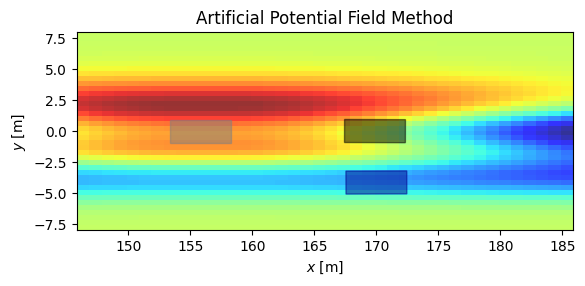

In [10]:
# simulation time
dt = 0.1 # time resolution
t_max = 5 # end time
time = np.arange(0,t_max,dt)

pfm = PotentialFieldMethod()

# traffic participant
obstacle = MovingObstacle()
pfm.append_obstacle(obstacle)

# road setup with two lanes 7 3.5 meters appart
lane_x = np.linspace(0, 100, 50)
lane_y = np.zeros_like(lane_x)
pfm.append_lane(lane_x, lane_y, weight_factor = 1)
    
#second lane with less weight
lane_y = np.zeros_like(lane_x) - 3.5
pfm.append_lane(lane_x, lane_y, weight_factor = 0.5)

# set position of cars
pfm.ego.set_position(0,-3.5, v= 120/3.6, yaw = 0.0)
obstacle.set_position(0, 0, v=110/3.6)

#create iterations for ideal and predictive
pfm1 = deepcopy(pfm)
pfm1.use_predictive_risk = True


models = [pfm.ego, pfm1.ego, obstacle]
names = ['static', 'predictive', 'obstacle']
colors = ['black', 'darkblue', 'grey']


"""animation"""
fig, ax = plt.subplots()

# set plot ranges
X_origin = np.linspace(-10, 30, 40)
Y_origin = np.linspace(-8, 8, 40)
x_center = obstacle.x
extent = [X_origin[0]+x_center, X_origin[-1]+x_center, Y_origin[0], Y_origin[-1]]
X,Y = np.meshgrid(X_origin + x_center, Y_origin)

# get hazard map
Z = pfm.get_risk_potential(X, Y)

# plot repulsive field as background
kwargs_imshow['aspect'] = 1
background  = ax.imshow(Z,extent=extent, **kwargs_imshow)

# obstacle outline
car_viz  = [ax.add_patch(car.plotoutline()) for car in models]


def update(frame):
    # prediction step
    yr = pfm.find_ideal_yawrate()
    tr = pfm.ego.predict_position(yr, pfm.search_time)

    # get the background data
    x_center = obstacle.x
    extent = [X_origin[0]+x_center, X_origin[-1]+x_center, Y_origin[0], Y_origin[-1]]

    X,Y = np.meshgrid(X_origin + x_center, Y_origin)
    Z = pfm.get_risk_potential(X, Y)

    # update plots
    background.set_data(Z)
    background.set_extent(extent)

    # update car rectangles
    for i, model in enumerate(models):
        car_viz[i].remove()
        car_viz[i] = ax.add_patch(model.plotoutline(color = colors[i], alpha=0.5))

    # update simulation
    pfm.update(dt)
    pfm1.update(dt)


ax.set_title("Artificial Potential Field Method")
ax.set_xlabel(r"$x$ [m]")
ax.set_ylabel(r"$y$ [m]")

#create animation
ani = animation.FuncAnimation(fig=fig, func=update, frames=int(t_max/dt), interval=dt*1000)

HTML(ani.to_jshtml())

# display(html)


Side by Side comparision of 'static' and 'global pd' risk potential

In [13]:
# simulation time
dt = 0.2 # time resolution
t_max = 5 # end time
time = np.arange(0,t_max,dt)

pfm = PotentialFieldMethod()

# traffic participant
obstacle = MovingObstacle()
pfm.append_obstacle(obstacle)

# road setup with two lanes 7 3.5 meters appart
lane_x = np.linspace(0, 100, 50)
lane_y = np.zeros_like(lane_x)
pfm.append_lane(lane_x, lane_y)
    
#second lane with less weight
lane_y = np.zeros_like(lane_x) - 3.5
pfm.append_lane(lane_x, lane_y, weight_factor = 0.8)

# set position of cars
pfm.ego.set_position(0,-3.5, v= 100/3.6, yaw = 0.0)
obstacle.set_position(35, 0, v=90/3.6)

pfm1 = deepcopy(pfm)
pfm1.use_global_pd = True
pfm1.d_global = 1


"""animation"""
# plot the actual data
fig, axes = plt.subplots(2,1)


# set plot ranges
X = np.linspace(0, 250, 30)
Y = np.linspace(-7, 7, 30) # np.arange(-7, 7, 0.1)
extent=[X[0],X[-1],Y[0],Y[-1]]
X,Y = np.meshgrid(X,Y)

# get hazard map
Z = pfm.get_risk_potential(X, Y)


backgrounds = [ax.contourf(X,Y,Z, **kwargs_contourf) for ax in axes]

# obstacle outline
car_viz  = [ax.add_patch(obstacle.plotoutline()) for ax in axes]


def update(frame):    

    #update simulation
    pfm.update(dt)
    pfm1.update(dt)


    Z1 = pfm.get_risk_potential(X, Y)
    Z2 = pfm1.get_risk_potential(X, Y)

    #update upper image
    backgrounds[0].remove()
    backgrounds[0] = axes[0].contourf(X,Y,Z1, **kwargs_contourf)

    backgrounds[1].remove()
    backgrounds[1] = axes[1].contourf(X,Y,Z2, **kwargs_contourf)

    # update car rectangles
    for i, ax in enumerate(axes):
        car_viz[i].remove()
        car_viz[i] = ax.add_patch(obstacle.plotoutline())

fig.set_tight_layout(True)
axes[0].set_title('static risk potential')
axes[1].set_title(f'global pd risk potential (d={pfm1.d_global})')

#create animation
ani = animation.FuncAnimation(fig=fig, func=update, frames=int(t_max/dt), interval=dt*1000, )

html = HTML(ani.to_jshtml())
plt.clf()
display(html)

<Figure size 640x480 with 0 Axes>

comparison of different speeds (WIP)

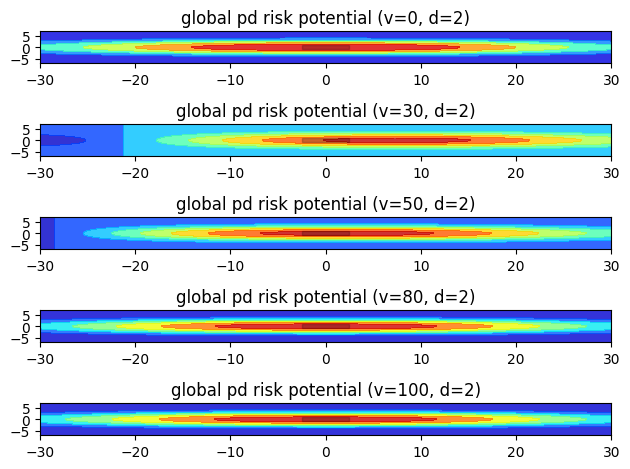

In [12]:
pfm = PotentialFieldMethod()

# traffic participant
obstacle = MovingObstacle()
pfm.append_obstacle(obstacle)

pfm.use_global_pd = True
pfm.d_global = 2

vs = [0, 30, 50, 80, 100]



# create plot
fig, axes = plt.subplots(len(vs),1)

# set plot ranges
X = np.linspace(-30, 30, 30)
Y = np.linspace(-7, 7, 30) # np.arange(-7, 7, 0.1)
extent=[X[0],X[-1],Y[0],Y[-1]]
X,Y = np.meshgrid(X,Y)

# setup one axis for each speed
for ax, v in zip(axes, vs):

    # set the car to the desired speed
    obstacle.set_position(0, 0, v = v)

    # set the risk potential
    Z = pfm.get_risk_potential(X, Y)
    ax.contourf(X,Y,Z, **kwargs_contourf)

    # obstacle outline
    ax.add_patch(obstacle.plotoutline())
    ax.set_title(f'global pd risk potential (v={v}, d={pfm.d_global})')


fig.set_tight_layout(True)
plt.show()